# Make Figure 1 of the paper

In [1]:
import os
import sys
import pandas as pd
import pygmt
from obspy import UTCDateTime
import tempfile
from pyproj import Transformer
from shapely.geometry import Point
from shapely.ops import unary_union, transform
import geopandas as gpd


from obspy.clients.fdsn import Client

notebook_dir = os.getcwd()
parent_dir = os.path.abspath(os.path.join(notebook_dir, '../'))
if parent_dir not in sys.path:
    sys.path.append(parent_dir)

from qc_utils import calc_active_days_of_stas


## Make figure 1(a), the station map

In [2]:
# Define the client 
client_inventory = Client("IRIS")


In [3]:
# Load the station data
stations = pd.read_csv('../data/datasets_all_regions/all_stations_2010_2015_ver3.csv',index_col=0)
stations

,network,station,longitude,latitude,elevation
0,7A,W01,-126.342499,48.079700,-1697.0
1,7A,W02,-126.496803,48.259300,-2133.0
2,7A,W03,-126.728699,48.387501,-2489.0
3,7A,W04,-126.890800,48.531700,-2319.0
4,7A,W06,-126.064697,48.182701,-1001.0
...,...,...,...,...,...
448,Z5,GB320,-125.912102,40.396599,-2332.0
449,Z5,GB321,-125.911697,40.392200,-2283.0
450,Z5,GB330,-126.584900,40.511101,-3156.0
451,Z5,GB331,-126.584000,40.513000,-3137.0


In [4]:
# Obtain the inventory for all stations
bulk_sta = []
for index, sta in stations.iterrows():
    network = sta['network']
    station = sta['station']
    loc = '*'
    ch = '?H?' 
    t1 = UTCDateTime('2010-01-01T00:00:00')
    t2 = UTCDateTime('2015-12-31T23:59:59')
    bulk_sta.append([network,station,loc,ch,t1,t2])
    
inv = client_inventory.get_stations_bulk(bulk_sta)

In [5]:
# Calculate the active days of each station
start_time = UTCDateTime('2010-01-01T00:00:00')
end_time = UTCDateTime('2015-12-31T23:59:59')
used_stations = calc_active_days_of_stas(inv, start_time, end_time)

# Combine data into a single DataFrame
stations = pd.DataFrame(used_stations)

In [6]:
# Load the data for the nodes of each region
df_pnsn_wa = pd.read_csv("../data/datasets_pnsn_wa/nodes_pnsn_wa.csv")
df_pnsn_jdf = pd.read_csv("../data/datasets_pnsn_jdf/nodes_pnsn_jdf.csv")
df_pnsn_nor = pd.read_csv("../data/datasets_pnsn_nor/nodes_pnsn_nor.csv")
df_pnsn_sor = pd.read_csv("../data/datasets_pnsn_sor/nodes_pnsn_sor.csv")
df_swa_shore = pd.read_csv("../data/datasets_swa_shore/nodes_swa_shore.csv")    
df_swa_shelf_trench = pd.read_csv("../data/datasets_swa_shelf/nodes_swa_shelf_trench.csv")
df_nwa_shore = pd.read_csv("../data/datasets_nwa_shore/nodes_nwa_shore.csv")    
df_nwa_shelf_trench = pd.read_csv("../data/datasets_nwa_shelf/nodes_nwa_shelf_trench.csv")
df_or_shore = pd.read_csv("../data/datasets_or_shore/nodes_or_shore.csv")
df_or_shelf_trench = pd.read_csv("../data/datasets_or_shelf/nodes_or_shelf_trench.csv")

plot [WARNING]: Cannot use auto-legend -l for variable symbol color. Option -l ignored.
/tmp/ipykernel_3045388/3812538289.py:83: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(x=[-110], y=[48], style="t0.3c", color="white", label="Station", pen="0.2p,black")


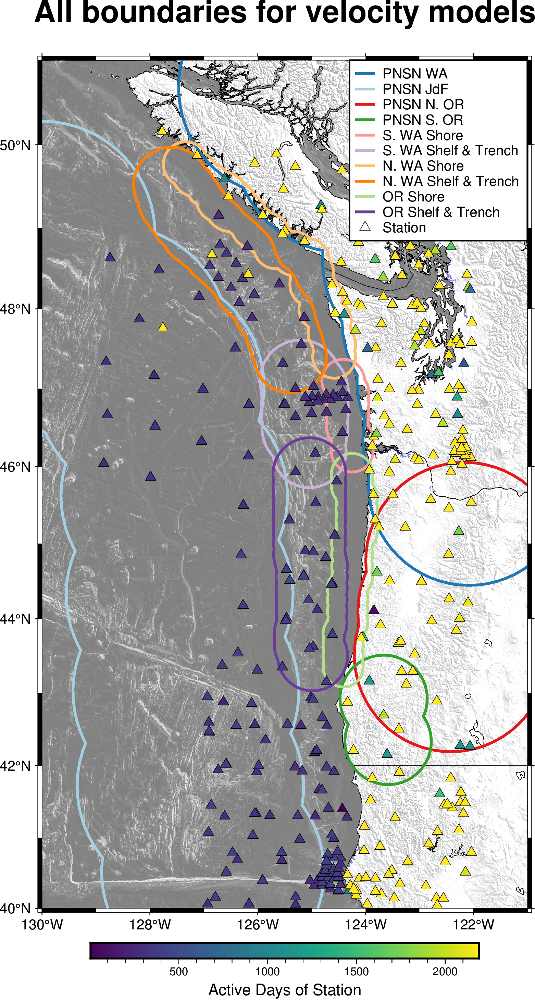

In [13]:


# Parameters for the plot
min_lat = 40
max_lat = 51
min_lon = -130
max_lon = -121

# Create a list to node sets
dfs = [df_pnsn_wa, df_pnsn_jdf, df_pnsn_nor, df_pnsn_sor, df_swa_shore, df_swa_shelf_trench,
       df_nwa_shore, df_nwa_shelf_trench, df_or_shore, df_or_shelf_trench]
colors = ['#1f78b4', '#a6cee3', '#e31a1c', '#33a02c', '#fb9a99',
          '#cab2d6', '#fdbf6f', '#ff7f00', '#b2df8a', '#6a3d9a']
region_names = ['PNSN WA', 'PNSN JdF', 'PNSN N. OR', 'PNSN S. OR', 'S. WA Shore', 'S. WA Shelf & Trench',
                       'N. WA Shore', 'N. WA Shelf & Trench', 'OR Shore', 'OR Shelf & Trench']

# Initialize the figure
fig = pygmt.Figure()

# Load grid data
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=[min_lon, max_lon, min_lat, max_lat])
shade = pygmt.grdgradient(grid=grid, azimuth="0/90", normalize="t1")

# Define target region
region = [min_lon, max_lon, min_lat, max_lat]
title = "All boundaries for velocity models"
fig.basemap(region=region, projection="M12c", frame=["af", f"WSne+t{title}"])

fig.grdimage(grid=grid, cmap="blue", shading=shade, transparency=50)
fig.coast(region=region, projection="M12c", shorelines=True, borders=[1, 2], resolution="f")
pygmt.makecpt(cmap="viridis", series=[stations['active_days'].min(), stations['active_days'].max()])

# Define transformers
transformer_to_utm = Transformer.from_crs("epsg:4326", "epsg:32610", always_xy=True)  # WGS84 to UTM zone 10N
transformer_to_wgs84 = Transformer.from_crs("epsg:32610", "epsg:4326", always_xy=True)  # UTM zone 10N to WGS84

for df, color,region in zip(dfs, colors,region_names):
    # Create a list to store the circles
    circles = []
    
    # Draw circles at the nodes
    for idx, row in df.iterrows():
        lon, lat = row["longitude"], row["latitude"]
        radius = (row['radius'] + row['buffer_zone']) * 1000  # Convert km to meters
        
        # Project to UTM
        x, y = transformer_to_utm.transform(lon, lat)
        
        # Create circle in UTM coordinates
        circle = Point(x, y).buffer(radius)
        
        # Project back to WGS84
        circle = transform(transformer_to_wgs84.transform, circle)
        
        circles.append(circle)
    
    # Create the union of all circles
    union_circles = unary_union(circles)
    
    # Convert the union to a GeoDataFrame
    gdf = gpd.GeoDataFrame(geometry=[union_circles])
    
       
    # Plot the union of circles
    for geom in gdf.geometry:
        if geom.geom_type == 'MultiPolygon':
            for poly in geom:
                x, y = poly.exterior.xy
                fig.plot(x=x, y=y, pen=f"1.8p,{color}", label=region)
        else:
            x, y = geom.exterior.xy
            fig.plot(x=x, y=y, pen=f"1.8,{color}", label=region)

fig.plot(
    x=stations["longitude"],
    y=stations["latitude"],
    style='t0.3c',
    cmap=True,
    pen=f"0.2p,black",
    fill=stations["active_days"],
    label="Stations",
)

# Plot a dummy point to add the station legend
fig.plot(x=[-110], y=[48], style="t0.3c", color="white", label="Station", pen="0.2p,black")

# Add the legend to the plot
fig.legend(position="JTR+w4.4+jTR", box='+gwhite+p1p')
fig.colorbar(frame="xaf+lActive Days of Station")

# Save and display the figure
fig.savefig("../data/datasets_all_regions/nodes_all_w_stas_2010_2015_ver3.pdf")
fig.show()

### Without the boundaries

/tmp/ipykernel_3125998/3511143687.py:73: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(x=[-110], y=[48], style="t0.3c", color="white", label="Station", pen="0.2p,black")
plot [WARNING]: Mismatch between actual (1) and expected (2) fields near line 1684 in file PB2002_boundaries.dig
plot [WARNING]: Mismatch between actual (1) and expected (2) fields near line 5086 in file PB2002_boundaries.dig
plot [WARNING]: Mismatch between actual (1) and expected (2) fields near line 5113 in file PB2002_boundaries.dig
plot [WARNING]: Your data array row 17 contains NaNs - no resampling taken place!
plot [WARNING]: Cannot use auto-legend -l for variable symbol color. Option -l ignored.


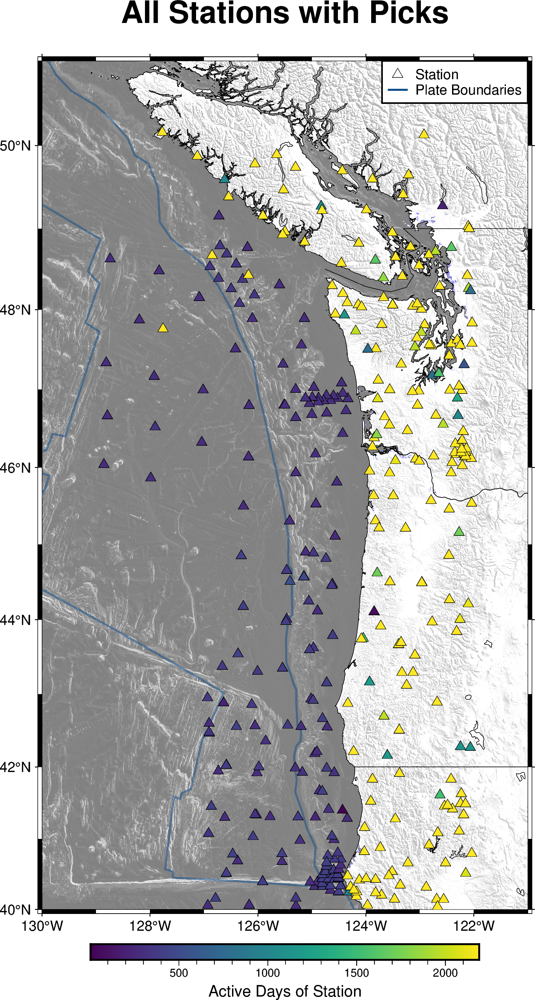

In [7]:


# Parameters for the plot
min_lat = 40
max_lat = 51
min_lon = -130
max_lon = -121

# # Create a list to node sets
# dfs = [df_pnsn_wa, df_pnsn_jdf, df_pnsn_nor, df_pnsn_sor, df_swa_shore, df_swa_shelf_trench,
#        df_nwa_shore, df_nwa_shelf_trench, df_or_shore, df_or_shelf_trench]
# colors = ['#1f78b4', '#a6cee3', '#e31a1c', '#33a02c', '#fb9a99',
#           '#cab2d6', '#fdbf6f', '#ff7f00', '#b2df8a', '#6a3d9a']
# region_names = ['PNSN WA', 'PNSN JdF', 'PNSN N. OR', 'PNSN S. OR', 'S. WA Shore', 'S. WA Shelf & Trench',
#                        'N. WA Shore', 'N. WA Shelf & Trench', 'OR Shore', 'OR Shelf & Trench']

# Initialize the figure
fig = pygmt.Figure()

# Load grid data
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=[min_lon, max_lon, min_lat, max_lat])
shade = pygmt.grdgradient(grid=grid, azimuth="0/90", normalize="t1")

# Define target region
region = [min_lon, max_lon, min_lat, max_lat]
title = "All Stations with Picks"
fig.basemap(region=region, projection="M12c", frame=["af", f"WSne+t{title}"])

fig.grdimage(grid=grid, cmap="blue", shading=shade, transparency=50)
fig.coast(region=region, projection="M12c", shorelines=True, borders=[1, 2], resolution="f")
pygmt.makecpt(cmap="viridis", series=[stations['active_days'].min(), stations['active_days'].max()])

# Define transformers
transformer_to_utm = Transformer.from_crs("epsg:4326", "epsg:32610", always_xy=True)  # WGS84 to UTM zone 10N
transformer_to_wgs84 = Transformer.from_crs("epsg:32610", "epsg:4326", always_xy=True)  # UTM zone 10N to WGS84

# for df, color,region in zip(dfs, colors,region_names):
#     # Create a list to store the circles
#     circles = []
    
#     # Draw circles at the nodes
#     for idx, row in df.iterrows():
#         lon, lat = row["longitude"], row["latitude"]
#         radius = (row['radius'] + row['buffer_zone']) * 1000  # Convert km to meters
        
#         # Project to UTM
#         x, y = transformer_to_utm.transform(lon, lat)
        
#         # Create circle in UTM coordinates
#         circle = Point(x, y).buffer(radius)
        
#         # Project back to WGS84
#         circle = transform(transformer_to_wgs84.transform, circle)
        
#         circles.append(circle)
    
#     # Create the union of all circles
#     union_circles = unary_union(circles)
    
#     # Convert the union to a GeoDataFrame
#     gdf = gpd.GeoDataFrame(geometry=[union_circles])
    
       
#     # Plot the union of circles
#     for geom in gdf.geometry:
#         if geom.geom_type == 'MultiPolygon':
#             for poly in geom:
#                 x, y = poly.exterior.xy
#                 fig.plot(x=x, y=y, pen=f"1.8p,{color}", label=region)
#         else:
#             x, y = geom.exterior.xy
#             fig.plot(x=x, y=y, pen=f"1.8,{color}", label=region)

# Plot a dummy point to add the station legend
fig.plot(x=[-110], y=[48], style="t0.3c", color="white", label="Station", pen="0.2p,black")

# Add plate boundaries
fig.plot(data="PB2002_boundaries.dig", pen="1.3p,dodgerblue4",transparency=50, label="Plate Boundaries")

# Plot the stations
fig.plot(
    x=stations["longitude"],
    y=stations["latitude"],
    style='t0.3c',
    cmap=True,
    pen=f"0.2p,black",
    fill=stations["active_days"],
    label="Stations",
)



# Add the legend to the plot
fig.legend(position="JTR+w3.6+jTR", box='+gwhite+p1p')
fig.colorbar(frame="xaf+lActive Days of Station")

# Save and display the figure
fig.savefig("../data/datasets_all_regions/nodes_all_w_stas_wo_boundaries_2010_2015_ver3.pdf")
fig.show()

## Make figure 1(b): events from ANSS and Morton-2023

### Load the ANSS catalog

In [8]:
# Read Morton's catalog
events_morton = pd.read_csv('../data/ds01.csv')
# Convert the TSTRING to datetime
events_morton['datetime'] = pd.to_datetime(events_morton['TSTRING'], format='%Y%m%d%H%M%S', utc=True)
events_morton = events_morton.sort_values(by='DEPTH')
events_morton.head()

,CI YEAR,TSTRING,YEAR,MONTH,DAY,HOUR,MINUTE,SECOND,LAT,LON,...,dist to nearest stn,tt RMS,ERH,ERZ,STRIKE,DIP,RAKE,PLATE DESIGNATION,TEMPLATE EVENT?,datetime
2039,4.0,2.014073e+13,2014.0,7.0,30.0,14.0,46.0,42.01,39.6440,-123.4185,...,34.0,0.54,4.4,1.2,NaN,NaN,NaN,Seaward of Trench,Catalog,2014-07-30 14:46:42+00:00
1603,2.0,2.013072e+13,2013.0,7.0,23.0,17.0,47.0,34.31,44.3795,-124.2178,...,30.4,0.13,1.4,0.4,NaN,NaN,NaN,Upper Plate,T,2013-07-23 17:47:34+00:00
1028,2.0,2.013012e+13,2013.0,1.0,21.0,8.0,33.0,54.55,42.2302,-124.6802,...,22.6,0.35,2.5,1.6,NaN,NaN,NaN,Interface,NaN,2013-01-21 08:33:54+00:00
2319,4.0,2.014092e+13,2014.0,9.0,18.0,22.0,27.0,59.56,40.3865,-124.3138,...,25.1,0.15,2.9,1.2,NaN,NaN,NaN,Upper Plate,NaN,2014-09-18 22:27:59+00:00
783,2.0,2.012112e+13,2012.0,11.0,16.0,9.0,14.0,37.74,42.3625,-124.6752,...,29.9,0.47,6.5,2.3,NaN,NaN,NaN,Interface,ST,2012-11-16 09:14:37+00:00


### Load the catalog from Morton-2023

In [9]:
events_anss = pd.read_csv('../data/datasets_anss/anss_2010-15.csv',index_col=0)
events_anss['datetime'] = pd.to_datetime(events_anss['time'], format='%Y-%m-%dT%H:%M:%S.%fZ')
events_anss = events_anss.sort_values(by='depth')
events_anss.head()

,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource,datetime
140451,2015-06-25T00:51:30.060Z,46.847500,-121.764333,-3.882,0.63,ml,8.0,85.0,0.02458,0.07,...,"22 km ENE of Ashford, Washington",earthquake,0.380,10.01,0.299,8.0,reviewed,uw,uw,2015-06-25 00:51:30.060
18555,2010-12-03T03:02:55.600Z,46.872333,-121.753667,-2.907,0.70,md,4.0,153.0,0.01473,0.09,...,"24 km ENE of Ashford, Washington",earthquake,0.050,0.54,0.050,3.0,reviewed,uw,uw,2010-12-03 03:02:55.600
17371,2010-11-12T21:20:06.900Z,46.857667,-121.756500,-2.907,0.70,md,4.0,110.0,0.02119,0.10,...,"23 km ENE of Ashford, Washington",earthquake,0.014,0.42,0.020,3.0,reviewed,uw,uw,2010-11-12 21:20:06.900
26580,2011-04-09T10:47:02.720Z,46.859833,-121.768000,-2.907,2.40,md,4.0,107.0,0.01934,0.08,...,"23 km ENE of Ashford, Washington",earthquake,0.022,0.55,0.030,3.0,reviewed,uw,uw,2011-04-09 10:47:02.720
32602,2011-07-12T09:35:43.950Z,46.861167,-121.762167,-2.907,1.80,md,4.0,108.0,0.02265,0.26,...,"23 km ENE of Ashford, Washington",earthquake,0.094,1.29,0.050,3.0,reviewed,uw,uw,2011-07-12 09:35:43.950


### Map the events

plot [WARNING]: Cannot use auto-legend -l for variable symbol color. Option -l ignored.
plot [WARNING]: Cannot use auto-legend -l for variable symbol color. Option -l ignored.


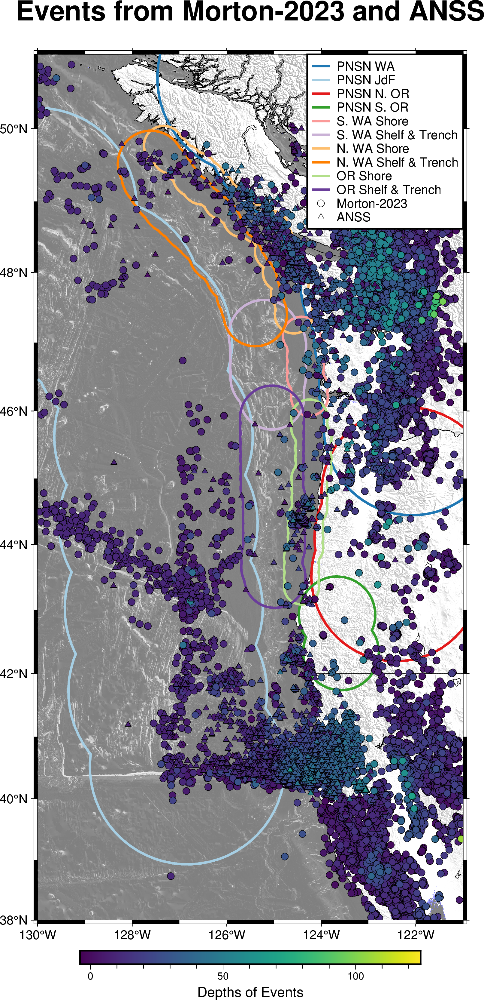

In [ ]:


# Parameters for the plot
min_lat = 38
max_lat = 51
min_lon = -130
max_lon = -121

# Create a list to node sets
dfs = [df_pnsn_wa, df_pnsn_jdf, df_pnsn_nor, df_pnsn_sor, df_swa_shore, df_swa_shelf_trench,
       df_nwa_shore, df_nwa_shelf_trench, df_or_shore, df_or_shelf_trench]
colors = ['#1f78b4', '#a6cee3', '#e31a1c', '#33a02c', '#fb9a99',
          '#cab2d6', '#fdbf6f', '#ff7f00', '#b2df8a', '#6a3d9a']
region_names = ['PNSN WA', 'PNSN JdF', 'PNSN N. OR', 'PNSN S. OR', 'S. WA Shore', 'S. WA Shelf & Trench',
                       'N. WA Shore', 'N. WA Shelf & Trench', 'OR Shore', 'OR Shelf & Trench']

# Initialize the figure
fig = pygmt.Figure()

# Load grid data
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=[min_lon, max_lon, min_lat, max_lat])
shade = pygmt.grdgradient(grid=grid, azimuth="0/90", normalize="t1")

# Define target region
region = [min_lon, max_lon, min_lat, max_lat]
title = "Events from Morton-2023 and ANSS"
fig.basemap(region=region, projection="M12c", frame=["af", f"WSne+t{title}"])

fig.grdimage(grid=grid, cmap="blue", shading=shade, transparency=50)
fig.coast(region=region, projection="M12c", shorelines=True, borders=[1, 2], resolution="f")
pygmt.makecpt(cmap="viridis", series=[events_anss['depth'].min(), events_anss['depth'].max()])

# Define transformers
transformer_to_utm = Transformer.from_crs("epsg:4326", "epsg:32610", always_xy=True)  # WGS84 to UTM zone 10N
transformer_to_wgs84 = Transformer.from_crs("epsg:32610", "epsg:4326", always_xy=True)  # UTM zone 10N to WGS84

for df, color,region in zip(dfs, colors,region_names):
    # Create a list to store the circles
    circles = []
    
    # Draw circles at the nodes
    for idx, row in df.iterrows():
        lon, lat = row["longitude"], row["latitude"]
        radius = (row['radius'] + row['buffer_zone']) * 1000  # Convert km to meters
        
        # Project to UTM
        x, y = transformer_to_utm.transform(lon, lat)
        
        # Create circle in UTM coordinates
        circle = Point(x, y).buffer(radius)
        
        # Project back to WGS84
        circle = transform(transformer_to_wgs84.transform, circle)
        
        circles.append(circle)
    
    # Create the union of all circles
    union_circles = unary_union(circles)
    
    # Convert the union to a GeoDataFrame
    gdf = gpd.GeoDataFrame(geometry=[union_circles])
    
       
    # Plot the union of circles
    for geom in gdf.geometry:
        if geom.geom_type == 'MultiPolygon':
            for poly in geom:
                x, y = poly.exterior.xy
                fig.plot(x=x, y=y, pen=f"1.8p,{color}", label=region)
        else:
            x, y = geom.exterior.xy
            fig.plot(x=x, y=y, pen=f"1.8,{color}", label=region)
fig.plot(
    x=events_anss["longitude"],
    y=events_anss["latitude"],
    style='c0.2c',
    cmap=True,
    pen=f"0.2p,black",
    fill=events_anss["depth"],
    label="Events from Morton-2023",
)

fig.plot(
    x=events_morton["LON"],
    y=events_morton["LAT"],
    style='t0.2c',
    cmap=True,
    pen=f"0.2p,black",
    fill=events_morton["DEPTH"],
    label="Events from ANSS",
)


# Plot a dummy point to add the station legend
fig.plot(x=[-110], y=[48], style="c0.2c", fill="white", label="Morton-2023", pen="0.2p,black")

# Plot a dummy point to add the station legend
fig.plot(x=[-110], y=[48], style="t0.2c", fill="white", label="ANSS", pen="0.2p,black")

# Add the legend to the plot
fig.legend(position="JTR+w4.4+jTR", box='+gwhite+p1p')
fig.colorbar(frame="xaf+lDepths of Events")

# Save and display the figure
fig.savefig("../data/datasets_all_regions/fig1b.pdf")
fig.show()

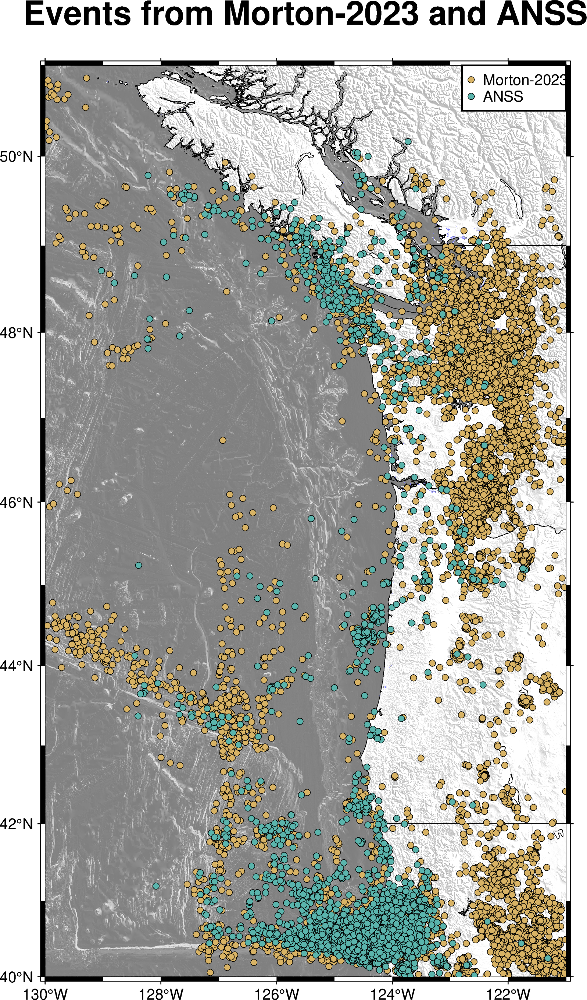

In [12]:


# Parameters for the plot
min_lat = 40
max_lat = 51
min_lon = -130
max_lon = -121

# # Create a list to node sets
# dfs = [df_pnsn_wa, df_pnsn_jdf, df_pnsn_nor, df_pnsn_sor, df_swa_shore, df_swa_shelf_trench,
#        df_nwa_shore, df_nwa_shelf_trench, df_or_shore, df_or_shelf_trench]
# colors = ['#1f78b4', '#a6cee3', '#e31a1c', '#33a02c', '#fb9a99',
#           '#cab2d6', '#fdbf6f', '#ff7f00', '#b2df8a', '#6a3d9a']
# region_names = ['PNSN WA', 'PNSN JdF', 'PNSN N. OR', 'PNSN S. OR', 'S. WA Shore', 'S. WA Shelf & Trench',
#                        'N. WA Shore', 'N. WA Shelf & Trench', 'OR Shore', 'OR Shelf & Trench']

# Initialize the figure
fig = pygmt.Figure()

# Load grid data
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=[min_lon, max_lon, min_lat, max_lat])
shade = pygmt.grdgradient(grid=grid, azimuth="0/90", normalize="t1")

# Define target region
region = [min_lon, max_lon, min_lat, max_lat]
title = "Events from Morton-2023 and ANSS"
fig.basemap(region=region, projection="M12c", frame=["af", f"WSne+t{title}"])

fig.grdimage(grid=grid, cmap="blue", shading=shade, transparency=50)
fig.coast(region=region, projection="M12c", shorelines=True, borders=[1, 2], resolution="f")

# # Define transformers
# transformer_to_utm = Transformer.from_crs("epsg:4326", "epsg:32610", always_xy=True)  # WGS84 to UTM zone 10N
# transformer_to_wgs84 = Transformer.from_crs("epsg:32610", "epsg:4326", always_xy=True)  # UTM zone 10N to WGS84

# for df, color,region in zip(dfs, colors,region_names):
#     # Create a list to store the circles
#     circles = []
    
#     # Draw circles at the nodes
#     for idx, row in df.iterrows():
#         lon, lat = row["longitude"], row["latitude"]
#         radius = (row['radius'] + row['buffer_zone']) * 1000  # Convert km to meters
        
#         # Project to UTM
#         x, y = transformer_to_utm.transform(lon, lat)
        
#         # Create circle in UTM coordinates
#         circle = Point(x, y).buffer(radius)
        
#         # Project back to WGS84
#         circle = transform(transformer_to_wgs84.transform, circle)
        
#         circles.append(circle)
    
#     # Create the union of all circles
#     union_circles = unary_union(circles)
    
#     # Convert the union to a GeoDataFrame
#     gdf = gpd.GeoDataFrame(geometry=[union_circles])
    
       
#     # Plot the union of circles
#     for geom in gdf.geometry:
#         if geom.geom_type == 'MultiPolygon':
#             for poly in geom:
#                 x, y = poly.exterior.xy
#                 fig.plot(x=x, y=y, pen=f"1.8p,{color}", label=region)
#         else:
#             x, y = geom.exterior.xy
#             fig.plot(x=x, y=y, pen=f"1.8,{color}", label=region)
fig.plot(
    x=events_anss["longitude"],
    y=events_anss["latitude"],
    style='c0.15c',
    pen=f"0.2p,black",
    fill='#d8b365',
    label="Morton-2023",
)

fig.plot(
    x=events_morton["LON"],
    y=events_morton["LAT"],
    style='c0.15c',
    pen=f"0.2p,black",
    fill='#5ab4ac',
    label="ANSS",
)



# Add the legend to the plot
fig.legend(position="JTR+w2.4+jTR", box='+gwhite+p1p')

# Save and display the figure
fig.savefig("../data/datasets_all_regions/fig1b.pdf")
fig.show()